<a href="https://colab.research.google.com/github/Jumulisa/Coffee-Disease-Detection/blob/main/Model_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kagglehub -q

In [ ]:
import kagglehub

path = kagglehub.dataset_download("nirmalsankalana/rocole-a-robusta-coffee-leaf-images-dataset")
print("Path to dataset files:", path)

100%|██████████| 388M/388M [00:05<00:00, 77.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/nirmalsankalana/rocole-a-robusta-coffee-leaf-images-dataset/versions/1


In [ ]:
import os

def show_tree(start_path, max_depth=3, current_depth=0):
    if current_depth >= max_depth:
        return
    items = sorted(os.listdir(start_path))
    for item in items:
        full = os.path.join(start_path, item)
        indent = '  ' * current_depth
        if os.path.isdir(full):
            count = len(os.listdir(full))
            print(indent + item + '/  (' + str(count) + ' items)')
            show_tree(full, max_depth, current_depth + 1)
        elif current_depth < 2:
            print(indent + item)

show_tree(path)

coffee___healthy/  (791 items)
  C10P10E1.jpg
  C10P10H1.jpg
  C10P11E1.jpg
  C10P11H1.jpg
  C10P12E1.jpg
  C10P12H1.jpg
  C10P13E1.jpg
  C10P13H1.jpg
  C10P14E1.jpg
  C10P14H1.jpg
  C10P15E1.jpg
  C10P15H1.jpg
  C10P17E1.jpg
  C10P17H1.jpg
  C10P18E1.jpg
  C10P18H1.jpg
  C10P19E1.jpg
  C10P19H1.jpg
  C10P1E2.jpg
  C10P1H2.jpg
  C10P20E1.jpg
  C10P21E1.jpg
  C10P21H1.jpg
  C10P22E1.jpg
  C10P22H1.jpg
  C10P23E1.jpg
  C10P23H1.jpg
  C10P24E1.jpg
  C10P24H1.jpg
  C10P25E1.jpg
  C10P25H1.jpg
  C10P26E1.jpg
  C10P26H1.jpg
  C10P27E1.jpg
  C10P27H1.jpg
  C10P28E1.jpg
  C10P28H1.jpg
  C10P29E1.jpg
  C10P29H1.jpg
  C10P2E2.jpg
  C10P2H2.jpg
  C10P30E1.jpg
  C10P30H1.jpg
  C10P33E1.jpg
  C10P33E2.jpg
  C10P33H1.jpg
  C10P33H2.jpg
  C10P34E1.jpg
  C10P34H1.jpg
  C10P35E1.jpg
  C10P35H1.jpg
  C10P36E1.jpg
  C10P36H1.jpg
  C10P37E1.jpg
  C10P37H1.jpg
  C10P38E1.jpg
  C10P38H1.jpg
  C10P39E1.jpg
  C10P39H1.jpg
  C10P3E1.jpg
  C10P3E2.jpg
  C10P3H2.jpg
  C10P40E1.jpg
  C10P40H1.jpg
  C10P4E2.jpg
  

In [ ]:
# The folder that contains the class subfolders with images

import os

data_root = None

for root, dirs, fnames in os.walk(path):
    if not dirs:
        continue
    has_images = False
    for d in dirs:
        subpath = os.path.join(root, d)
        if os.path.isdir(subpath):
            img_count = len([f for f in os.listdir(subpath)
                             if f.lower().endswith(('.jpg', '.png', '.jpeg', '.JPG'))])
            if img_count > 5:
                has_images = True
                break
    if has_images and len(dirs) >= 2:
        data_root = root
        break

if data_root is None:
    # maybe images are one level deeper
    for root, dirs, fnames in os.walk(path):
        img_count = len([f for f in fnames
                         if f.lower().endswith(('.jpg', '.png', '.jpeg', '.JPG'))])
        if img_count > 10:
            data_root = os.path.dirname(root)
            break

FINAL_DATASET = data_root if data_root else path

print('Dataset path:', FINAL_DATASET)
print('Contents:', sorted(os.listdir(FINAL_DATASET)))
print('')

total = 0
class_dirs = []
for name in sorted(os.listdir(FINAL_DATASET)):
    full_path = os.path.join(FINAL_DATASET, name)
    if os.path.isdir(full_path):
        count = len([f for f in os.listdir(full_path)
                     if f.lower().endswith(('.jpg', '.png', '.jpeg', '.JPG'))])
        if count > 0:
            print(name + ': ' + str(count) + ' images')
            total += count
            class_dirs.append(name)

print('')
print('Total: ' + str(total) + ' images')
print('Number of classes: ' + str(len(class_dirs)))

Dataset path: /root/.cache/kagglehub/datasets/nirmalsankalana/rocole-a-robusta-coffee-leaf-images-dataset/versions/1
Contents: ['coffee___healthy', 'coffee___red_spider_mite', 'coffee___rust']

coffee___healthy: 791 images
coffee___red_spider_mite: 167 images
coffee___rust: 602 images

Total: 1560 images
Number of classes: 3


## 2. Explore the Data

Sample images from each class, class distribution, image sizes, and color profiles.

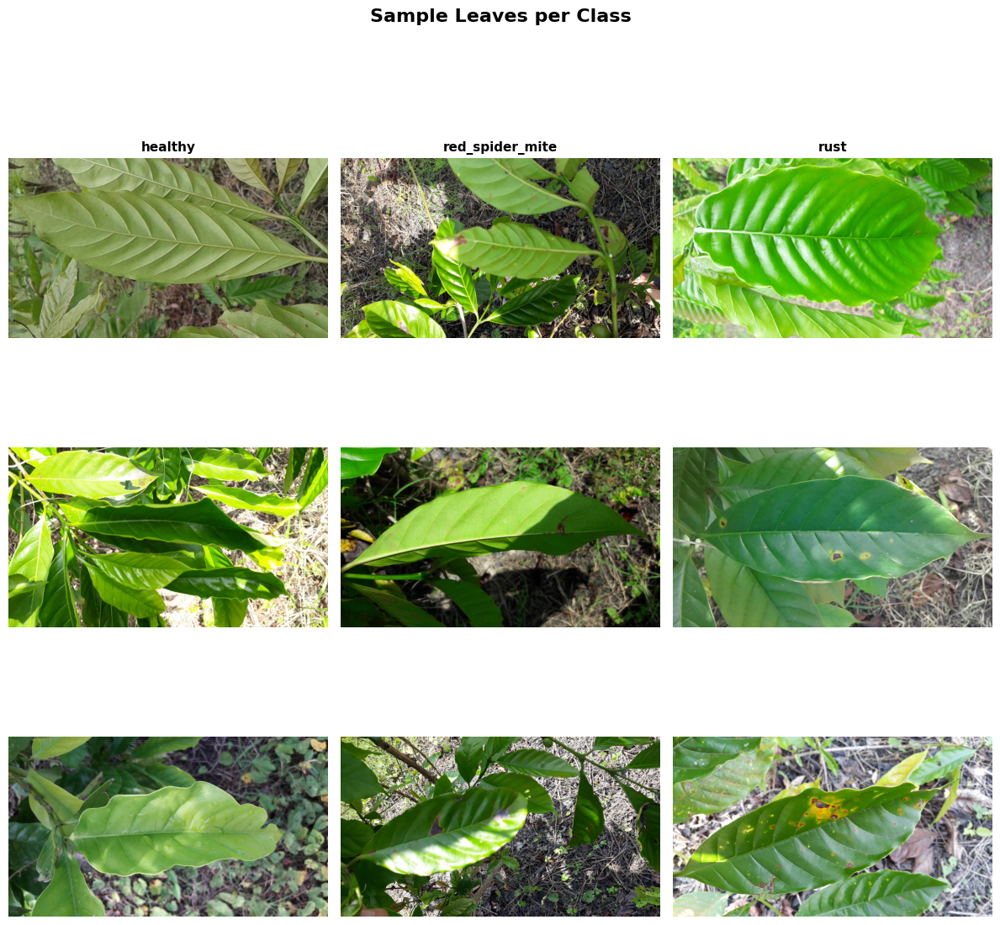

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import os

num_classes = len(class_dirs)

fig, axes = plt.subplots(3, num_classes, figsize=(4 * num_classes, 12))
fig.suptitle('Sample Leaves per Class', fontsize=16, fontweight='bold', y=1.01)

for col, class_name in enumerate(class_dirs):
    class_path = os.path.join(FINAL_DATASET, class_name)
    images = [f for f in os.listdir(class_path)
              if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    picked = random.sample(images, min(3, len(images)))

    for row, img_name in enumerate(picked):
        img = mpimg.imread(os.path.join(class_path, img_name))
        ax = axes[row][col]
        ax.imshow(img)
        if row == 0:
            ax.set_title(class_name.replace('coffee___', ''), fontsize=11, fontweight='bold')
        ax.axis('off')

plt.tight_layout()
plt.show()

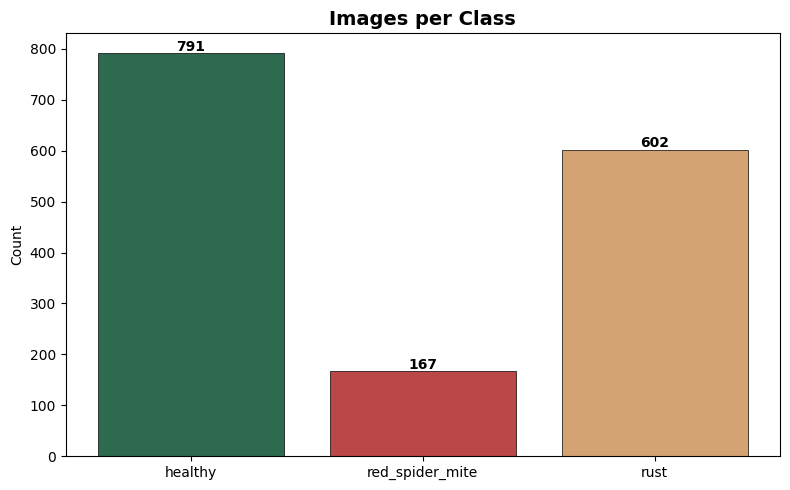

In [ ]:
import matplotlib.pyplot as plt

class_counts = {}
for name in class_dirs:
    full_path = os.path.join(FINAL_DATASET, name)
    count = len([f for f in os.listdir(full_path)
                 if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
    class_counts[name.replace('coffee___', '')] = count

fig, ax = plt.subplots(figsize=(8, 5))
colors = ['#2d6a4f', '#bc4749', '#d4a373']
bars = ax.bar(class_counts.keys(), class_counts.values(),
              color=colors[:len(class_counts)], edgecolor='black', linewidth=0.5)

for bar, val in zip(bars, class_counts.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
            str(val), ha='center', fontweight='bold')

ax.set_title('Images per Class', fontsize=14, fontweight='bold')
ax.set_ylabel('Count')
plt.tight_layout()
plt.show()

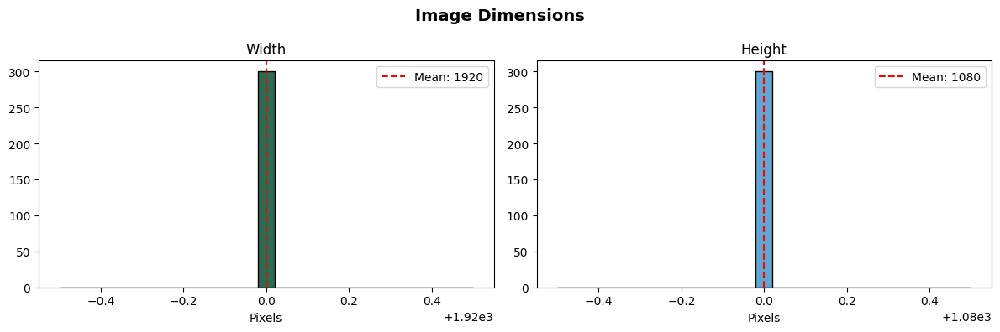

Width  - min: 1920 max: 1920 mean: 1920
Height - min: 1080 max: 1080 mean: 1080


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

all_paths = []
for name in class_dirs:
    folder = os.path.join(FINAL_DATASET, name)
    for f in os.listdir(folder):
        if f.lower().endswith(('.jpg', '.png', '.jpeg')):
            all_paths.append(os.path.join(folder, f))

sample = random.sample(all_paths, min(300, len(all_paths)))

widths = []
heights = []
for p in sample:
    try:
        img = Image.open(p)
        w, h = img.size
        widths.append(w)
        heights.append(h)
    except:
        pass

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.hist(widths, bins=25, color='#2d6a4f', edgecolor='black')
ax1.set_title('Width')
ax1.set_xlabel('Pixels')
ax1.axvline(np.mean(widths), color='red', linestyle='--',
            label='Mean: {:.0f}'.format(np.mean(widths)))
ax1.legend()

ax2.hist(heights, bins=25, color='#5fa8d3', edgecolor='black')
ax2.set_title('Height')
ax2.set_xlabel('Pixels')
ax2.axvline(np.mean(heights), color='red', linestyle='--',
            label='Mean: {:.0f}'.format(np.mean(heights)))
ax2.legend()

fig.suptitle('Image Dimensions', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('Width  - min:', min(widths), 'max:', max(widths), 'mean:', round(np.mean(widths)))
print('Height - min:', min(heights), 'max:', max(heights), 'mean:', round(np.mean(heights)))

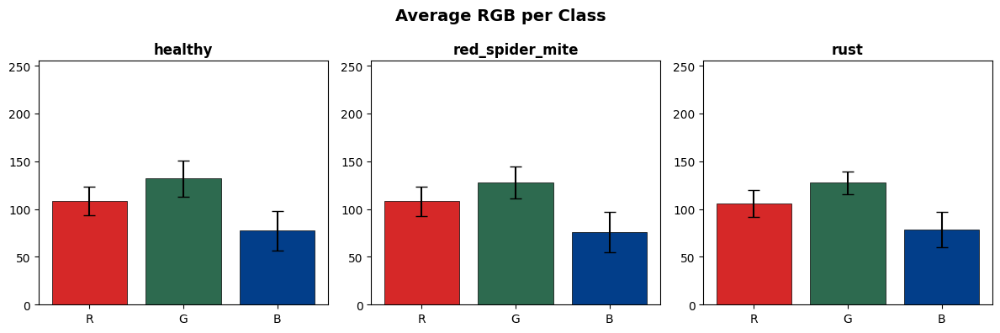

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

fig, axes = plt.subplots(1, len(class_dirs), figsize=(4 * len(class_dirs), 4))

for idx, class_name in enumerate(class_dirs):
    class_path = os.path.join(FINAL_DATASET, class_name)
    images = [f for f in os.listdir(class_path)
              if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    picked = random.sample(images, min(50, len(images)))

    r_avg, g_avg, b_avg = [], [], []
    for img_name in picked:
        try:
            img = Image.open(os.path.join(class_path, img_name)).convert('RGB')
            small = img.resize((64, 64))
            arr = np.array(small, dtype=np.float32)
            r_avg.append(np.mean(arr[:, :, 0]))
            g_avg.append(np.mean(arr[:, :, 1]))
            b_avg.append(np.mean(arr[:, :, 2]))
        except:
            pass

    ax = axes[idx]
    means = [np.mean(r_avg), np.mean(g_avg), np.mean(b_avg)]
    stds = [np.std(r_avg), np.std(g_avg), np.std(b_avg)]
    ax.bar([0, 1, 2], means, yerr=stds, color=['#d62828', '#2d6a4f', '#023e8a'],
           capsize=5, edgecolor='black', linewidth=0.5)
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(['R', 'G', 'B'])
    ax.set_title(class_name.replace('coffee___', ''), fontweight='bold')
    ax.set_ylim(0, 255)

fig.suptitle('Average RGB per Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()




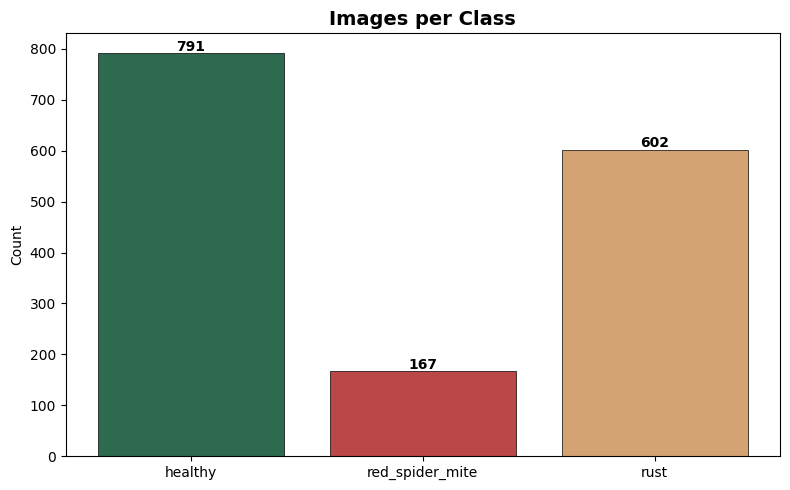

In [ ]:
import matplotlib.pyplot as plt

class_counts = {}
for name in class_dirs:
    full_path = os.path.join(FINAL_DATASET, name)
    count = len([f for f in os.listdir(full_path)
                 if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
    class_counts[name.replace('coffee___', '')] = count

fig, ax = plt.subplots(figsize=(8, 5))
colors = ['#2d6a4f', '#bc4749', '#d4a373']
bars = ax.bar(class_counts.keys(), class_counts.values(),
              color=colors[:len(class_counts)], edgecolor='black', linewidth=0.5)

for bar, val in zip(bars, class_counts.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
            str(val), ha='center', fontweight='bold')

ax.set_title('Images per Class', fontsize=14, fontweight='bold')
ax.set_ylabel('Count')
plt.tight_layout()
plt.show()

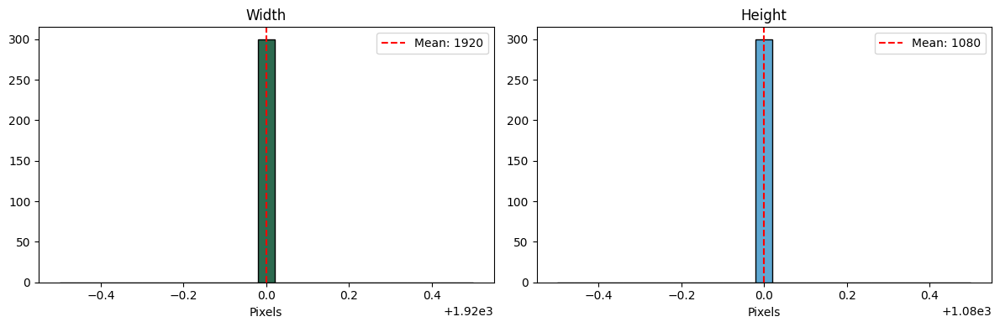

Width  - min: 1920 max: 1920 mean: 1920
Height - min: 1080 max: 1080 mean: 1080


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

all_paths = []
for name in class_dirs:
    folder = os.path.join(FINAL_DATASET, name)
    for f in os.listdir(folder):
        if f.lower().endswith(('.jpg', '.png', '.jpeg')):
            all_paths.append(os.path.join(folder, f))

sample = random.sample(all_paths, min(300, len(all_paths)))

widths = []
heights = []
for p in sample:
    try:
        img = Image.open(p)
        w, h = img.size
        widths.append(w)
        heights.append(h)
    except:
        pass

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.hist(widths, bins=25, color='#2d6a4f', edgecolor='black')
ax1.set_title('Width')
ax1.set_xlabel('Pixels')
ax1.axvline(np.mean(widths), color='red', linestyle='--',
            label='Mean: {:.0f}'.format(np.mean(widths)))
ax1.legend()

ax2.hist(heights, bins=25, color='#5fa8d3', edgecolor='black')
ax2.set_title('Height')
ax2.set_xlabel('Pixels')
ax2.axvline(np.mean(heights), color='red', linestyle='--',
            label='Mean: {:.0f}'.format(np.mean(heights)))
ax2.legend()

plt.tight_layout()
plt.show()

print('Width  - min:', min(widths), 'max:', max(widths), 'mean:', round(np.mean(widths)))
print('Height - min:', min(heights), 'max:', max(heights), 'mean:', round(np.mean(heights)))

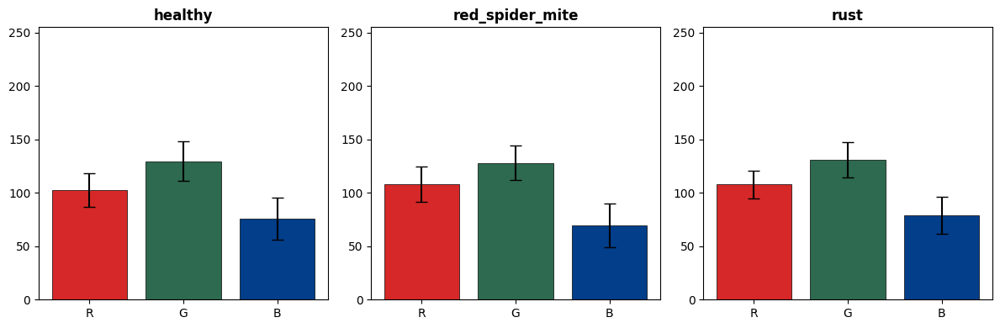

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

fig, axes = plt.subplots(1, len(class_dirs), figsize=(4 * len(class_dirs), 4))

for idx, class_name in enumerate(class_dirs):
    class_path = os.path.join(FINAL_DATASET, class_name)
    images = [f for f in os.listdir(class_path)
              if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    picked = random.sample(images, min(50, len(images)))

    r_avg, g_avg, b_avg = [], [], []
    for img_name in picked:
        try:
            img = Image.open(os.path.join(class_path, img_name)).convert('RGB')
            small = img.resize((64, 64))
            arr = np.array(small, dtype=np.float32)
            r_avg.append(np.mean(arr[:, :, 0]))
            g_avg.append(np.mean(arr[:, :, 1]))
            b_avg.append(np.mean(arr[:, :, 2]))
        except:
            pass

    ax = axes[idx]
    means = [np.mean(r_avg), np.mean(g_avg), np.mean(b_avg)]
    stds = [np.std(r_avg), np.std(g_avg), np.std(b_avg)]
    ax.bar([0, 1, 2], means, yerr=stds, color=['#d62828', '#2d6a4f', '#023e8a'],
           capsize=5, edgecolor='black', linewidth=0.5)
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(['R', 'G', 'B'])
    ax.set_title(class_name.replace('coffee___', ''), fontweight='bold')
    ax.set_ylim(0, 255)

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=30,
    width_shift_range=0.15,
    height_shift_range=0.15,
    horizontal_flip=True,
    zoom_range=0.2,
    brightness_range=[0.7, 1.3],
    fill_mode='nearest',
    validation_split=0.15
)

val_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.15
)

train_gen = train_datagen.flow_from_directory(
    FINAL_DATASET,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_gen = val_datagen.flow_from_directory(
    FINAL_DATASET,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42
)

print('Class indices:', train_gen.class_indices)
print('Training samples:', train_gen.samples)
print('Validation samples:', val_gen.samples)

CLASS_NAMES = list(train_gen.class_indices.keys())
print('Classes:', CLASS_NAMES)

Found 1327 images belonging to 3 classes.
Found 233 images belonging to 3 classes.
Class indices: {'coffee___healthy': 0, 'coffee___red_spider_mite': 1, 'coffee___rust': 2}
Training samples: 1327
Validation samples: 233
Classes: ['coffee___healthy', 'coffee___red_spider_mite', 'coffee___rust']


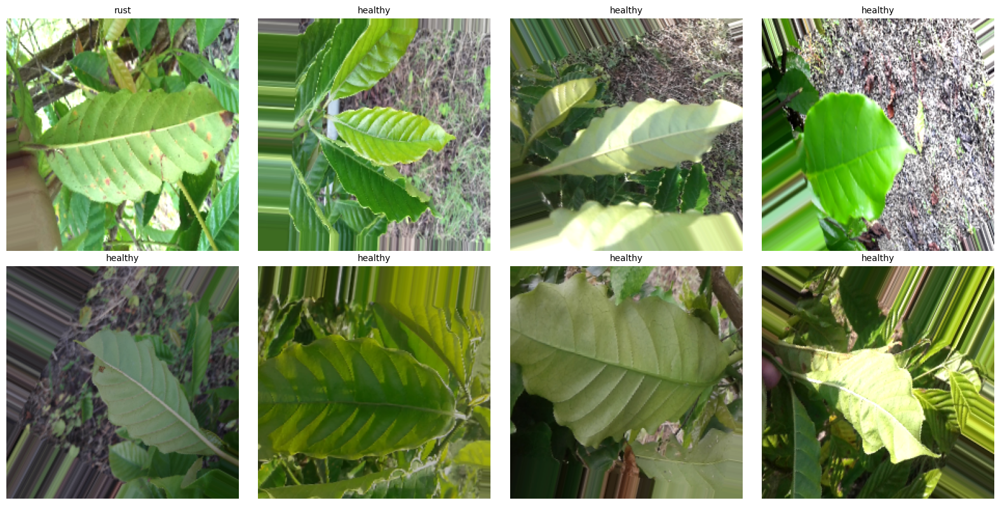

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

batch_images, batch_labels = next(train_gen)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i in range(8):
    ax = axes[i // 4][i % 4]
    ax.imshow(batch_images[i])
    label_idx = np.argmax(batch_labels[i])
    ax.set_title(CLASS_NAMES[label_idx].replace('coffee___', ''), fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model

base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(train_gen.num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

trainable = sum(p.numpy().size for p in model.trainable_weights)
frozen = sum(p.numpy().size for p in model.non_trainable_weights)
print('Trainable params:', trainable)
print('Frozen params:', frozen)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Trainable params: 164355
Frozen params: 2257984


In [ ]:
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

MODEL_PATH = '/content/coffee_disease_model.h5'

callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1
    ),
    ModelCheckpoint(
        MODEL_PATH,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    callbacks=callbacks,
    verbose=1
)

print('Best val accuracy: {:.2f}%'.format(max(history.history['val_accuracy']) * 100))

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5417 - loss: 1.0640
Epoch 1: val_accuracy improved from -inf to 0.71245, saving model to /content/coffee_disease_model.h5


42/42 ━━━━━━━━━━━━━━━━━━━━ 118s 3s/step - accuracy: 0.5431 - loss: 1.0607 - val_accuracy: 0.7124 - val_loss: 0.7067 - learning_rate: 0.0010
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6906 - loss: 0.7571
Epoch 2: val_accuracy improved from 0.71245 to 0.72532, saving model to /content/coffee_disease_model.h5


42/42 ━━━━━━━━━━━━━━━━━━━━ 107s 3s/step - accuracy: 0.6903 - loss: 0.7573 - val_accuracy: 0.7253 - val_loss: 0.6231 - learning_rate: 0.0010
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7090 - loss: 0.7275
Epoch 3: val_accuracy did not improve from 0.72532
42/42 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.7089 - loss: 0.7274 - val_accuracy: 0.6438 - val_loss: 0.7962 - learning_rate: 0.0010
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7474 - loss: 0.6658
Epoch 4: val_accuracy did not improve from 0.72532
42/42 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.7467 - loss: 0.6664 - val_accuracy: 0.6867 - val_loss: 0.7102 - learning_rate: 0.0010
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7337 - loss: 0.6521
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 5: val_accuracy did not improve from 0.72532
42/42 ━━━━━━━━━━━━━━━━━━━━ 104s 2s/step - accuracy: 0.7337 - loss: 0.6522 - val_accuracy: 0.6009 - va

42/42 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - accuracy: 0.7269 - loss: 0.6520 - val_accuracy: 0.7296 - val_loss: 0.6589 - learning_rate: 5.0000e-04
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7284 - loss: 0.6390
Epoch 7: val_accuracy improved from 0.72961 to 0.73391, saving model to /content/coffee_disease_model.h5


42/42 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - accuracy: 0.7286 - loss: 0.6389 - val_accuracy: 0.7339 - val_loss: 0.6476 - learning_rate: 5.0000e-04
Epoch 7: early stopping
Restoring model weights from the end of the best epoch: 2.
Best val accuracy: 73.39%


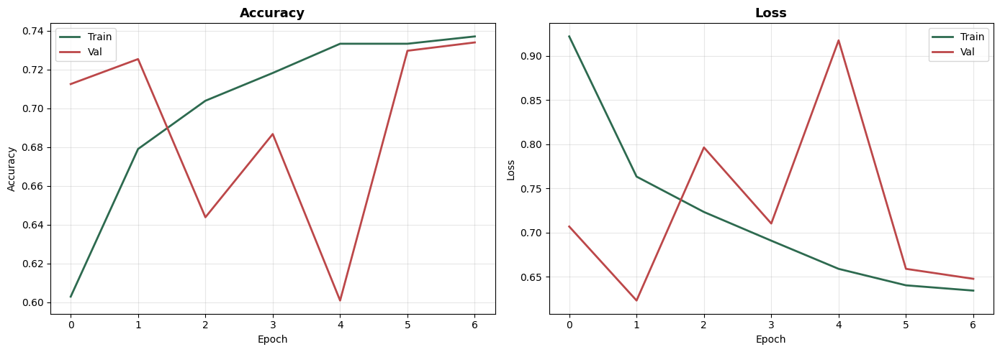

In [ ]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2, color='#2d6a4f')
ax1.plot(history.history['val_accuracy'], label='Val', linewidth=2, color='#bc4749')
ax1.set_title('Accuracy', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2, color='#2d6a4f')
ax2.plot(history.history['val_loss'], label='Val', linewidth=2, color='#bc4749')
ax2.set_title('Loss', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

ft_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
    ModelCheckpoint(MODEL_PATH, monitor='val_accuracy', save_best_only=True)
]

ft_history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,
    callbacks=ft_callbacks,
    verbose=1
)

print('Best val accuracy after fine-tuning: {:.2f}%'.format(
    max(ft_history.history['val_accuracy']) * 100))

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6240 - loss: 0.8239

42/42 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.6245 - loss: 0.8232 - val_accuracy: 0.7897 - val_loss: 0.5685
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - accuracy: 0.6807 - loss: 0.7352 - val_accuracy: 0.7897 - val_loss: 0.5564
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7363 - loss: 0.6682

42/42 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - accuracy: 0.7358 - loss: 0.6687 - val_accuracy: 0.7940 - val_loss: 0.5522
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7165 - loss: 0.6837

42/42 ━━━━━━━━━━━━━━━━━━━━ 132s 3s/step - accuracy: 0.7163 - loss: 0.6836 - val_accuracy: 0.8026 - val_loss: 0.5532
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 133s 3s/step - accuracy: 0.7042 - loss: 0.7005 - val_accuracy: 0.8026 - val_loss: 0.5534
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 148s 4s/step - accuracy: 0.7357 - loss: 0.6535 - val_accuracy: 0.8026 - val_loss: 0.5453
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 130s 3s/step - accuracy: 0.7246 - loss: 0.6603 - val_accuracy: 0.8026 - val_loss: 0.5454
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.7346 - loss: 0.6439 - val_accuracy: 0.7983 - val_loss: 0.5426
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 130s 3s/step - accuracy: 0.7436 - loss: 0.6141 - val_accuracy: 0.7983 - val_loss: 0.5364
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7728 - loss: 0.5731

42/42 ━━━━━━━━━━━━━━━━━━━━ 132s 3s/step - accuracy: 0.7728 - loss: 0.5733 - val_accuracy: 0.8112 - val_loss: 0.5257
Best val accuracy after fine-tuning: 81.12%


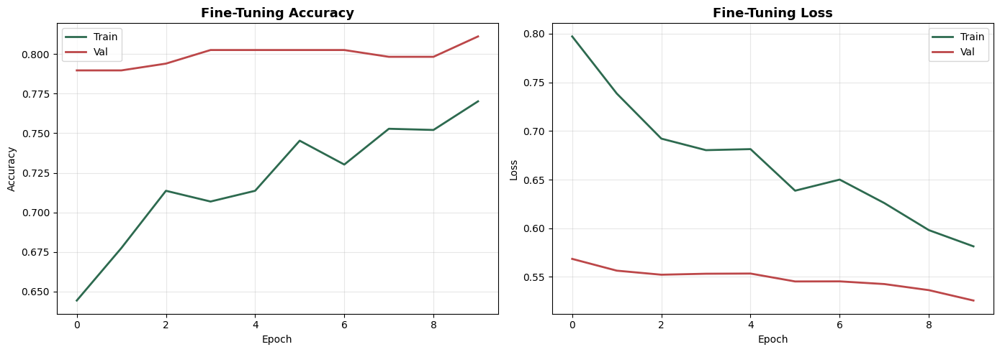

In [ ]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(ft_history.history['accuracy'], label='Train', linewidth=2, color='#2d6a4f')
ax1.plot(ft_history.history['val_accuracy'], label='Val', linewidth=2, color='#bc4749')
ax1.set_title('Fine-Tuning Accuracy', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(ft_history.history['loss'], label='Train', linewidth=2, color='#2d6a4f')
ax2.plot(ft_history.history['val_loss'], label='Val', linewidth=2, color='#bc4749')
ax2.set_title('Fine-Tuning Loss', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

best_model = load_model(MODEL_PATH)

val_gen.reset()
preds = best_model.predict(val_gen, verbose=1)
pred_classes = np.argmax(preds, axis=1)
true_classes = val_gen.classes[:len(pred_classes)]

class_labels = list(val_gen.class_indices.keys())
short_labels = [c.replace('coffee___', '') for c in class_labels]

print('=' * 60)
print('CLASSIFICATION REPORT')
print('=' * 60)
print(classification_report(true_classes, pred_classes, target_names=short_labels))

acc = accuracy_score(true_classes, pred_classes)
print('Overall Accuracy: {:.2f}%'.format(acc * 100))

8/8 ━━━━━━━━━━━━━━━━━━━━ 29s 4s/step
CLASSIFICATION REPORT
                 precision    recall  f1-score   support

        healthy       0.88      0.95      0.91       118
red_spider_mite       0.00      0.00      0.00        25
           rust       0.73      0.86      0.79        90

       accuracy                           0.81       233
      macro avg       0.54      0.60      0.57       233
   weighted avg       0.73      0.81      0.77       233

Overall Accuracy: 81.12%


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


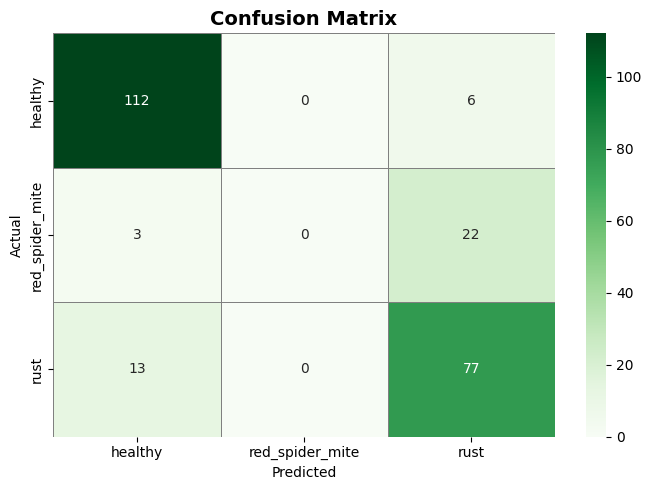

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(true_classes, pred_classes)

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=short_labels, yticklabels=short_labels,
            linewidths=0.5, linecolor='gray', ax=ax)
ax.set_title('Confusion Matrix', fontsize=14, fontweight='bold')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.tight_layout()
plt.show()

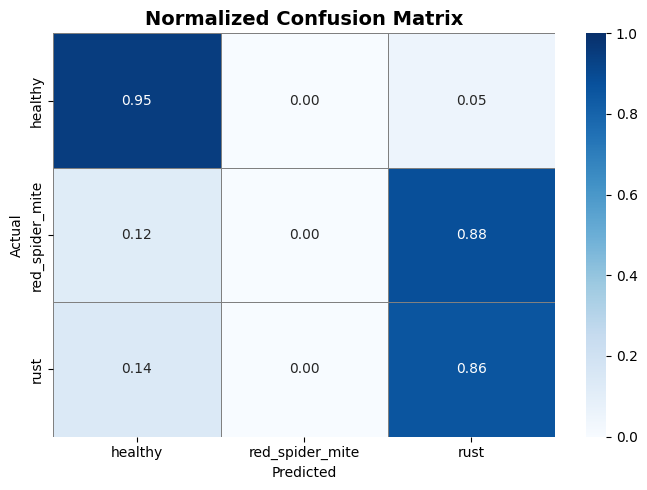

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=short_labels, yticklabels=short_labels,
            linewidths=0.5, linecolor='gray', ax=ax, vmin=0, vmax=1)
ax.set_title('Normalized Confusion Matrix', fontsize=14, fontweight='bold')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.tight_layout()
plt.show()

In [ ]:
print('Per-Class Accuracy')
print('-' * 45)

for i, name in enumerate(short_labels):
    mask = (true_classes == i)
    correct = np.sum(pred_classes[mask] == i)
    total = np.sum(mask)
    pct = correct / total * 100 if total > 0 else 0
    print('  {:25s} {:6.2f}%  ({}/{})'.format(name, pct, correct, total))

print('')
print('  {:25s} {:6.2f}%'.format('OVERALL', acc * 100))

Per-Class Accuracy
---------------------------------------------
  healthy                    94.92%  (112/118)
  red_spider_mite             0.00%  (0/25)
  rust                       85.56%  (77/90)

  OVERALL                    81.12%


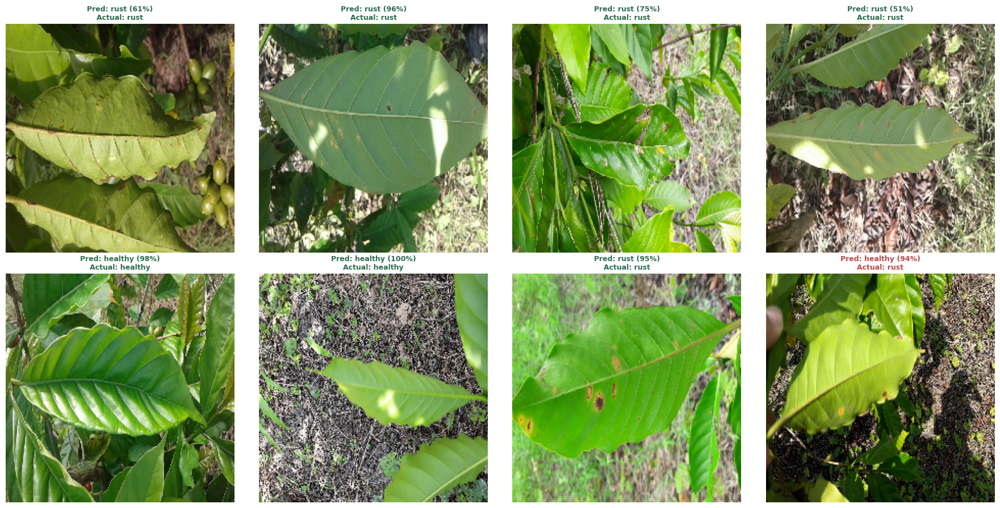

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import random
import os

fig, axes = plt.subplots(2, 4, figsize=(18, 9))

test_paths = random.sample(all_paths, 8)

for i, img_path in enumerate(test_paths):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_batch = np.expand_dims(img_array, axis=0)

    prediction = best_model.predict(img_batch, verbose=0)
    pred_idx = np.argmax(prediction[0])
    pred_name = short_labels[pred_idx]
    pred_conf = prediction[0][pred_idx] * 100

    actual_folder = img_path.split(os.sep)[-2]
    actual = actual_folder.replace('coffee___', '')

    match = (pred_name == actual)

    ax = axes[i // 4][i % 4]
    ax.imshow(img_array)
    color = '#2d6a4f' if match else '#bc4749'
    ax.set_title('Pred: {} ({:.0f}%)\nActual: {}'.format(pred_name, pred_conf, actual),
                 fontsize=9, color=color, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import cv2
import numpy as np


def estimate_severity(image_path, disease_name):
    clean_name = disease_name.replace('coffee___', '')

    if clean_name == 'healthy':
        return {'level': None, 'percent': 0.0, 'message': 'Leaf is healthy.'}

    img = cv2.imread(image_path)
    if img is None:
        return {'level': 'moderate', 'percent': -1, 'message': 'Could not read image.'}

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    green_mask = cv2.inRange(hsv, np.array([20, 25, 25]), np.array([95, 255, 255]))
    brown_mask = cv2.inRange(hsv, np.array([5, 30, 30]), np.array([25, 255, 180]))
    yellow_mask = cv2.inRange(hsv, np.array([15, 50, 100]), np.array([35, 255, 255]))
    dark_mask = cv2.inRange(hsv, np.array([0, 0, 10]), np.array([180, 80, 60]))
    red_mask = cv2.inRange(hsv, np.array([0, 50, 50]), np.array([10, 255, 255]))

    disease_mask = cv2.bitwise_or(brown_mask, yellow_mask)
    disease_mask = cv2.bitwise_or(disease_mask, dark_mask)
    disease_mask = cv2.bitwise_or(disease_mask, red_mask)

    leaf_mask = cv2.bitwise_or(green_mask, disease_mask)

    kernel = np.ones((5, 5), np.uint8)
    leaf_mask = cv2.morphologyEx(leaf_mask, cv2.MORPH_CLOSE, kernel)
    leaf_mask = cv2.morphologyEx(leaf_mask, cv2.MORPH_OPEN, kernel)
    disease_mask = cv2.morphologyEx(disease_mask, cv2.MORPH_CLOSE, kernel)

    disease_in_leaf = cv2.bitwise_and(disease_mask, leaf_mask)

    leaf_pixels = int(np.sum(leaf_mask > 0))
    disease_pixels = int(np.sum(disease_in_leaf > 0))

    if leaf_pixels < 100:
        return {'level': 'moderate', 'percent': -1, 'message': 'Not enough leaf area detected.'}

    pct = (disease_pixels / leaf_pixels) * 100
    pct = max(0.0, min(100.0, pct))

    if pct < 25:
        level = 'mild'
        msg = 'Early-stage. About {:.0f}% affected. Treat within the week.'.format(pct)
    elif pct < 50:
        level = 'moderate'
        msg = 'Moderate infection. About {:.0f}% affected. Treat within 2-3 days.'.format(pct)
    else:
        level = 'severe'
        msg = 'Severe damage. About {:.0f}% affected. Immediate action needed.'.format(pct)

    return {'level': level, 'percent': round(pct, 1), 'message': msg}

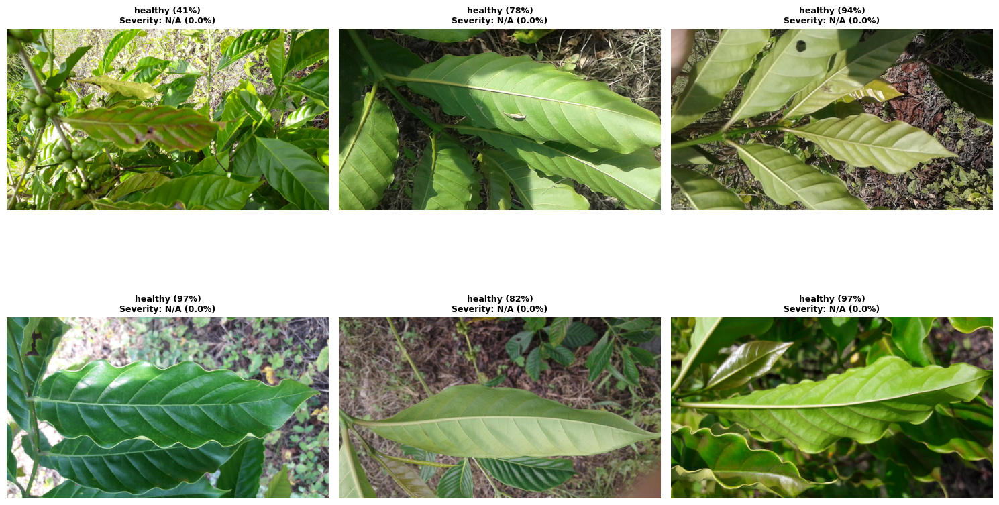

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import cv2
import random

test_samples = random.sample(all_paths, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, path in enumerate(test_samples):
    img = load_img(path, target_size=(224, 224))
    arr = img_to_array(img) / 255.0
    batch = np.expand_dims(arr, axis=0)
    pred = best_model.predict(batch, verbose=0)
    pred_idx = np.argmax(pred[0])
    disease = class_labels[pred_idx]
    conf = pred[0][pred_idx] * 100

    sev = estimate_severity(path, disease)

    display_img = cv2.imread(path)
    display_img = cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB)

    ax = axes[i // 3][i % 3]
    ax.imshow(display_img)

    disease_short = disease.replace('coffee___', '')
    sev_label = sev['level'] if sev['level'] else 'N/A'
    title = '{} ({:.0f}%)\nSeverity: {} ({:.1f}%)'.format(
        disease_short, conf, sev_label, sev['percent'])
    ax.set_title(title, fontsize=9, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from google.colab import files

print('Model saved at:', MODEL_PATH)
files.download(MODEL_PATH)

Model saved at: /content/coffee_disease_model.h5


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print('Architecture: MobileNetV2 + custom head')
print('Input size: 224 x 224 x 3')
print('Classes:', short_labels)
print('Training samples:', train_gen.samples)
print('Validation samples:', val_gen.samples)
print('Overall accuracy: {:.2f}%'.format(acc * 100))
print('Severity thresholds:')
print('  Mild:     < 25% leaf area affected')
print('  Moderate: 25-50% leaf area affected')
print('  Severe:   > 50% leaf area affected')
print('Model file: coffee_disease_model.h5')

Architecture: MobileNetV2 + custom head
Input size: 224 x 224 x 3
Classes: ['healthy', 'red_spider_mite', 'rust']
Training samples: 1327
Validation samples: 233
Overall accuracy: 81.12%
Severity thresholds:
  Mild:     < 25% leaf area affected
  Moderate: 25-50% leaf area affected
  Severe:   > 50% leaf area affected
Model file: coffee_disease_model.h5
